In [93]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
import nltk
import string
from nltk.corpus import stopwords
from sklearn.neighbors import NearestNeighbors
import re

%matplotlib inline

In [1]:
!python -V

Python 3.8.8


In [2]:
import nltk

nltk.download([
    'names',
    'stopwords',
    'state_union',
    'twitter_samples',
    'movie_reviews',
    'averaged_perceptron_tagger',
    'vader_lexicon',
    'punkt',
])

[nltk_data] Downloading package names to
[nltk_data]     /Users/d_anderson/nltk_data...
[nltk_data]   Package names is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/d_anderson/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package state_union to
[nltk_data]     /Users/d_anderson/nltk_data...
[nltk_data]   Package state_union is already up-to-date!
[nltk_data] Downloading package twitter_samples to
[nltk_data]     /Users/d_anderson/nltk_data...
[nltk_data]   Package twitter_samples is already up-to-date!
[nltk_data] Downloading package movie_reviews to
[nltk_data]     /Users/d_anderson/nltk_data...
[nltk_data]   Package movie_reviews is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/d_anderson/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package vader_lexicon to


True

In [3]:
words = [w for w in nltk.corpus.state_union.words() if w.isalpha()]

In [4]:
# stop words to load into list

stopwords = nltk.corpus.stopwords.words("english")

In [5]:
# stop words to load into list

words = [w for w in words if w.lower() not in stopwords]

In [6]:
from pprint import pprint

In [7]:
text = """
For some quick analysis, creating a corpus could be overkill.
If all you need is a word list,
there are simpler ways to achieve that goal."""

pprint(nltk.word_tokenize(text), width=79, compact=True)

['For', 'some', 'quick', 'analysis', ',', 'creating', 'a', 'corpus', 'could',
 'be', 'overkill', '.', 'If', 'all', 'you', 'need', 'is', 'a', 'word', 'list',
 ',', 'there', 'are', 'simpler', 'ways', 'to', 'achieve', 'that', 'goal', '.']


In [8]:
from typing import List
from __future__ import annotations

## Creating Frequency Distributions

In [9]:
import pandas as pd

# settings to display all columns
pd.set_option("display.max_columns", None)

df = pd.read_csv('data/twitter_flighthub_advanced_search.csv')
df.head()

,Category,Keyword,Web_Page_URL,Tweet_Website,Author_Name,Author_Web_Page_URL,Tweet_Timestamp,Tweet_Content,Tweet_Image_URL,Tweet_Video_URL,Tweet_Number_of_Likes,Tweet_Number_of_Retweets,Tweet_Number_of_Reviews,Tweet_Number_of_share,Comment_Website,Comment_Name,Comment_Author__URL,Comment_Timestamp,Comment_Content,Comment_Image_URL,Comment_Video_URL,Comment_Number_of_Likes,Comment_Number_of_Retweets,Comment_Number_of_Reviews,Comment_Number_of_share
0,Post&Comment,NaN,https://twitter.com/FlightHub/with_replies,https://twitter.com/FlightHub/status/146824263...,@FlightHub,https://twitter.com/FlightHub,1.638891e+12,"We are sorry for bad experience you had , Kin...",NaN,NaN,NaN,NaN,NaN,NaN,undefined,undefined,undefined,undefined,undefined,undefined,undefined,undefined,undefined,undefined,undefined
1,Post&Comment,NaN,https://twitter.com/FlightHub/with_replies,https://twitter.com/FlightHub/status/146805997...,@FlightHub,https://twitter.com/FlightHub,1.638848e+12,"Hi, We will do our best to help you with your...",NaN,NaN,NaN,NaN,NaN,NaN,undefined,undefined,undefined,undefined,undefined,undefined,undefined,undefined,undefined,undefined,undefined
2,Post&Comment,NaN,https://twitter.com/FlightHub/with_replies,https://twitter.com/FlightHub/status/146811665...,@FlightHub,https://twitter.com/FlightHub,1.638861e+12,"We are really sorry to hear that, please dire...",NaN,NaN,NaN,NaN,NaN,NaN,undefined,undefined,undefined,undefined,undefined,undefined,undefined,undefined,undefined,undefined,undefined
3,Post&Comment,NaN,https://twitter.com/FlightHub/with_replies,https://twitter.com/FlightHub/status/146805763...,@FlightHub,https://twitter.com/FlightHub,1.638847e+12,"@DjonDjayHi, as we have mentioned in our respo...",NaN,NaN,NaN,NaN,1,NaN,https://twitter.com/AkramZangene/status/132560...,@AkramZangene,https://twitter.com/AkramZangene,1604883602000,\n#Lufthansa will refund my money but you #fli...,NaN,NaN,NaN,1,2,NaN
4,Post&Comment,NaN,https://twitter.com/FlightHub/with_replies,https://twitter.com/FlightHub/status/146805763...,@FlightHub,https://twitter.com/FlightHub,1.638847e+12,"@DjonDjayHi, as we have mentioned in our respo...",NaN,NaN,NaN,NaN,1,NaN,https://twitter.com/FlightHub/status/131166255...,@FlightHub,https://twitter.com/FlightHub,1601559696000,FlightHub is proud to sponsor the Fondation du...,NaN,NaN,2,1,17,NaN


In [10]:
pip install texthero

Note: you may need to restart the kernel to use updated packages.


In [11]:
import texthero as hero
from texthero import preprocessing
custom_pipeline = [preprocessing.fillna,
                   #preprocessing.lowercase,
                   preprocessing.remove_whitespace,
                   preprocessing.remove_diacritics
                   #preprocessing.remove_brackets
                  ]

df['clean_text'] = hero.clean(df['Comment_Content'], custom_pipeline)
df['clean_text'] = [n.replace('{','') for n in df['clean_text']]
df['clean_text'] = [n.replace('}','') for n in df['clean_text']]
df['clean_text'] = [n.replace('(','') for n in df['clean_text']]
df['clean_text'] = [n.replace(')','') for n in df['clean_text']]

In [12]:
# transform df['clean_text'] into list of strings

df['clean_text'] = df.clean_text.tolist()

In [13]:
text = df.clean_text.tolist()

In [14]:
text

['undefined',
 'undefined',
 'undefined',
 '#Lufthansa will refund my money but you #flighthub have to submit my request instead of holding my money. Stop doing the #fruad and do the right thing!',
 'FlightHub is proud to sponsor the Fondation du Centre des femmes de Montreal and is thrilled to be helping women take flight!"- Sona Bedrossian, General Counsel of FlightHub and Co-president of the fundraising campaign at the Fondation du Centre des femmes de Montreal.',
 '@DjonDjayHi, as we have mentioned in our response to your previous comment, please privately message us your booking ID and a phone number - where we can reach out to you for further assistance between 9AM and 9PM Eastern Time - so we can assist you.',
 "You guys already told me can't fix this and sending me to another trash company which never contacted me since this afternoon phone that never responded, emails that never responded just like you guys. Very upset because it wasn't my fault and I had to pay for it.",
 'I 

In [15]:
fd = nltk.FreqDist(text)

In [16]:
fd.most_common(3)

[('undefined', 685),
 ('', 74),
 ('Air Canada Refunds Update: Over the past few weeks we have received thousands of refund requests for Air Canada bookings. Rest assured all eligible bookings will be processed by July 12th, 2021 in accordance with the timeline set by the Canadian Government & Air Canada.',
  11)]

### Data Cleaning

In [17]:
# get rid of columns that have 'undefined'
df = df.loc[df['clean_text'] != 'undefined']

#### Check for duplicates

Check for duplicate rows and columns.

In [18]:
# Use duplicated()

# Sum of duplicate rows

print(df['clean_text'].duplicated().sum())

print(df['clean_text'].duplicated().mean())

464
0.20413550373955125


In [19]:
# we have 20 % duplicates. Let's get rid of these

df['Comment_Content'].duplicated(keep=False).sum()

721

In [20]:
df['Comment_Content'][df['Comment_Content'].duplicated(keep=False)].head()

56    Dear Customers, \n\nWe've added a new feature ...
57    why is it so difficult to get a refund. Hours ...
58     sorry for the inconvenience, kindly message u...
60    I just want to point out RIGHT NOW, that  is a...
61    Unless I hear that you finally got around to r...
Name: Comment_Content, dtype: object

In [21]:
df = df.drop_duplicates()

In [22]:
# check 
df.duplicated().sum()

0

In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2273 entries, 3 to 2957
Data columns (total 26 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Category                    2273 non-null   object 
 1   Keyword                     0 non-null      float64
 2   Web_Page_URL                2273 non-null   object 
 3   Tweet_Website               2273 non-null   object 
 4   Author_Name                 2273 non-null   object 
 5   Author_Web_Page_URL         2273 non-null   object 
 6   Tweet_Timestamp             2273 non-null   float64
 7   Tweet_Content               2215 non-null   object 
 8   Tweet_Image_URL             349 non-null    object 
 9   Tweet_Video_URL             0 non-null      float64
 10  Tweet_Number_of_Likes       779 non-null    object 
 11  Tweet_Number_of_Retweets    731 non-null    object 
 12  Tweet_Number_of_Reviews     2273 non-null   object 
 13  Tweet_Number_of_share       0 non

In [24]:
df.T.duplicated()

Category                      False
Keyword                       False
Web_Page_URL                  False
Tweet_Website                 False
Author_Name                   False
Author_Web_Page_URL           False
Tweet_Timestamp               False
Tweet_Content                 False
Tweet_Image_URL               False
Tweet_Video_URL                True
Tweet_Number_of_Likes         False
Tweet_Number_of_Retweets      False
Tweet_Number_of_Reviews       False
Tweet_Number_of_share          True
Comment_Website               False
Comment_Name                  False
Comment_Author__URL           False
Comment_Timestamp             False
Comment_Content               False
Comment_Image_URL             False
Comment_Video_URL              True
Comment_Number_of_Likes       False
Comment_Number_of_Retweets    False
Comment_Number_of_Reviews     False
Comment_Number_of_share        True
clean_text                    False
dtype: bool

In [25]:
df = df.drop(columns=['Tweet_Video_URL', 'Comment_Video_URL', 'Comment_Number_of_share'])

### Dealing with the Null values

We noticed a few columns with null values. If we plan on modelling these will need to be dealt with.

In [26]:
# total nulls per column

nulls = df.isna().sum()

nulls

Category                         0
Keyword                       2273
Web_Page_URL                     0
Tweet_Website                    0
Author_Name                      0
Author_Web_Page_URL              0
Tweet_Timestamp                  0
Tweet_Content                   58
Tweet_Image_URL               1924
Tweet_Number_of_Likes         1494
Tweet_Number_of_Retweets      1542
Tweet_Number_of_Reviews          0
Tweet_Number_of_share         2273
Comment_Website                299
Comment_Name                     1
Comment_Author__URL              0
Comment_Timestamp              411
Comment_Content                 68
Comment_Image_URL             2208
Comment_Number_of_Likes       1753
Comment_Number_of_Retweets    2064
Comment_Number_of_Reviews     1239
clean_text                       0
dtype: int64

In [27]:
df = df.drop(columns=['Keyword', 'Tweet_Image_URL', 'Tweet_Number_of_Likes', 'Tweet_Number_of_Retweets',
                     'Tweet_Number_of_share', 'Comment_Website', 'Comment_Image_URL', 'Comment_Number_of_Retweets', 
                     'Comment_Number_of_Reviews'])

In [28]:
# total nulls per column

nulls = df.isna().sum()

nulls

Category                      0
Web_Page_URL                  0
Tweet_Website                 0
Author_Name                   0
Author_Web_Page_URL           0
Tweet_Timestamp               0
Tweet_Content                58
Tweet_Number_of_Reviews       0
Comment_Name                  1
Comment_Author__URL           0
Comment_Timestamp           411
Comment_Content              68
Comment_Number_of_Likes    1753
clean_text                    0
dtype: int64

In [29]:
# total nulls per column

nulls = df.isna().sum()

nulls

Category                      0
Web_Page_URL                  0
Tweet_Website                 0
Author_Name                   0
Author_Web_Page_URL           0
Tweet_Timestamp               0
Tweet_Content                58
Tweet_Number_of_Reviews       0
Comment_Name                  1
Comment_Author__URL           0
Comment_Timestamp           411
Comment_Content              68
Comment_Number_of_Likes    1753
clean_text                    0
dtype: int64

In [30]:
# focussing in on problem cols

display(nulls[nulls > 0])

print(' ')
print('Percentage of null rows')
print(nulls[nulls > 0]/df.shape[0]*100)

print(' ')
print('data types of null cols')
display(df[nulls[nulls>0].index].dtypes)


Tweet_Content                58
Comment_Name                  1
Comment_Timestamp           411
Comment_Content              68
Comment_Number_of_Likes    1753
dtype: int64

 
Percentage of null rows
Tweet_Content               2.551694
Comment_Name                0.043995
Comment_Timestamp          18.081830
Comment_Content             2.991641
Comment_Number_of_Likes    77.122745
dtype: float64
 
data types of null cols


Tweet_Content              object
Comment_Name               object
Comment_Timestamp          object
Comment_Content            object
Comment_Number_of_Likes    object
dtype: object

In [31]:
df.head(1)

,Category,Web_Page_URL,Tweet_Website,Author_Name,Author_Web_Page_URL,Tweet_Timestamp,Tweet_Content,Tweet_Number_of_Reviews,Comment_Name,Comment_Author__URL,Comment_Timestamp,Comment_Content,Comment_Number_of_Likes,clean_text
3,Post&Comment,https://twitter.com/FlightHub/with_replies,https://twitter.com/FlightHub/status/146805763...,@FlightHub,https://twitter.com/FlightHub,1.638847e+12,"@DjonDjayHi, as we have mentioned in our respo...",1,@AkramZangene,https://twitter.com/AkramZangene,1604883602000,\n#Lufthansa will refund my money but you #fli...,NaN,#Lufthansa will refund my money but you #fligh...


In [32]:
df = df.drop(columns=['Category', 'Web_Page_URL', 'Tweet_Website', 'Author_Web_Page_URL'])

In [33]:
import matplotlib.pyplot as plt

In [34]:
df = df.sort_values('Tweet_Number_of_Reviews')

In [35]:
df['Comment_Name'].value_counts()

@FlightHub          708
@moncherlecaire      20
@Graeme304           18
@hassine_bouafif     17
@melxfresh           16
                   ... 
@ChilloChris          1
@fitted365            1
@djchiriko            1
@JoeyAMancuso         1
@TahiraKaleem43       1
Name: Comment_Name, Length: 772, dtype: int64

In [36]:
df = df.loc[df['Comment_Name'] != '@FlightHub']

In [37]:
df['Comment_Name'].value_counts()

@moncherlecaire     20
@Graeme304          18
@hassine_bouafif    17
@melxfresh          16
@riteshasoni        16
                    ..
@fitted365           1
@djchiriko           1
@Satheesh_N06        1
@JoeyAMancuso        1
@TahiraKaleem43      1
Name: Comment_Name, Length: 771, dtype: int64

In [38]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1565 entries, 3 to 2260
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Author_Name              1565 non-null   object 
 1   Tweet_Timestamp          1565 non-null   float64
 2   Tweet_Content            1517 non-null   object 
 3   Tweet_Number_of_Reviews  1565 non-null   object 
 4   Comment_Name             1564 non-null   object 
 5   Comment_Author__URL      1565 non-null   object 
 6   Comment_Timestamp        1527 non-null   object 
 7   Comment_Content          1505 non-null   object 
 8   Comment_Number_of_Likes  454 non-null    object 
 9   clean_text               1565 non-null   object 
dtypes: float64(1), object(9)
memory usage: 134.5+ KB


In [39]:
df

,Author_Name,Tweet_Timestamp,Tweet_Content,Tweet_Number_of_Reviews,Comment_Name,Comment_Author__URL,Comment_Timestamp,Comment_Content,Comment_Number_of_Likes,clean_text
3,@FlightHub,1.638847e+12,"@DjonDjayHi, as we have mentioned in our respo...",1,@AkramZangene,https://twitter.com/AkramZangene,1604883602000,\n#Lufthansa will refund my money but you #fli...,NaN,#Lufthansa will refund my money but you #fligh...
1031,@FlightHub,1.621257e+12,"Hi , you can submit your refund request throug...",1,@vrajshah229,https://twitter.com/vrajshah229,1622829510000,I requested through it and I got an email from...,NaN,I requested through it and I got an email from...
1033,@FlightHub,1.621257e+12,"Hi , you can submit your refund request throug...",1,@vrajshah229,https://twitter.com/vrajshah229,1621217363000,I got no reply. Meanwhile Air Canada has send ...,NaN,I got no reply. Meanwhile Air Canada has send ...
2058,@FlightHub,1.581535e+12,"Hi, please email us at customercare@flighthub....",1,@QandAalldaylol,https://twitter.com/QandAalldaylol,1581815306000,"I hope you do, not another form letter. Poor p...",NaN,"I hope you do, not another form letter. Poor p..."
1048,@FlightHub,1.620771e+12,I can see that someone was working on your ca...,1,@vrajshah229,https://twitter.com/vrajshah229,1620763639000,Please respond and help and not hold people's ...,NaN,Please respond and help and not hold people's ...
...,...,...,...,...,...,...,...,...,...,...
2230,@TravelLeisure,1.565387e+12,"The largest waterfall in #Vietnam, Ban Gioc Fa...",96,@Aztrans_Yogya,https://twitter.com/Aztrans_Yogya,1565466337000,Like In Paradise,NaN,Like In Paradise
2228,@TravelLeisure,1.565387e+12,"The largest waterfall in #Vietnam, Ban Gioc Fa...",96,@Legendary_HZ,https://twitter.com/Legendary_HZ,1565458773000,Beautiful,NaN,Beautiful
2227,@TravelLeisure,1.565387e+12,"The largest waterfall in #Vietnam, Ban Gioc Fa...",96,@FeelHood,https://twitter.com/FeelHood,1565471621000,NaN,NaN,
2237,@TravelLeisure,1.565387e+12,"The largest waterfall in #Vietnam, Ban Gioc Fa...",96,@andriyoganp,https://twitter.com/andriyoganp,1565501955000,On The Way,NaN,On The Way


## Creating Frequency Distributions

In [40]:
text = df.clean_text.tolist()
text

['#Lufthansa will refund my money but you #flighthub have to submit my request instead of holding my money. Stop doing the #fruad and do the right thing!',
 'I requested through it and I got an email from flighthub that my refund is approved. But I have a question. My credit card has been changed since I booked. Currently I use a different one. So how will my refund be processed?',
 'I got no reply. Meanwhile Air Canada has send me an email that zi am eligible for refund as per new policy on April 13th 2021. I have to contact my travel agent. Please let me know the status',
 'I hope you do, not another form letter. Poor poor customer service.',
 "Please respond and help and not hold people's money in this pandemic!",
 "I can't get a full refund for my trip cancelled in april due to COVID! Also I can't use the credits to book a flight for my friend? The credits expire in april and I have no plans for it",
 'No one has yet reached out to me. Looking for a speedy resolution',
 'I got no r

In [41]:
fd = nltk.FreqDist(text)

In [42]:
fd.most_common(10)

[('', 66),
 ('needs to treat their customers better this is RIDICULOUS. Ive waited since FEB to get my refund and on the phone for 12 HRS in the last 3 DAYS and I keep getting passed around! My friends booked through at the same time and got THEIRS where is MY REFUND',
  4),
 ('OMG ME TOO', 4),
 ("I have been trying for a long time. Today I filled out out the request for refund AGAIN, let's see how long I have to wait THIS TIME.",
  4),
 ("Cela fait plus qu'un an que je cours apres. Connaissez vous la balle du ping-pong? Moi je suis rendu comme ca. FlightHub ne dit que vous attendiez apres Air France et airfrance me dit qu'ils n'ont pas recu le dossier de remboursement!!",
  4),
 ('Et quand les remboursements des billets Air France ?', 4),
 ('Booking number: 177-963-282', 4),
 ('Done', 4),
 ("Don't use Flighthub.. It is a scam!!", 4),
 ('Had to pay $1000 more to finalize my tickets. #Unbelievable if you are reading this tweet, never ever book your tickets through #flighthub they are th

In [43]:
df.clean_text.value_counts().head(5)

                                                                                                                                                                                                                                       66
Booking number: 177-963-282                                                                                                                                                                                                             4
Don't use Flighthub.. It is a scam!!                                                                                                                                                                                                    4
I uncovered a pricing glitch on FlightHub's website and when I attempted to rectify the error, was told of a policy that required the price that I booked at and my booking reference on the same screenshot, which is impossible       4
Had to pay $1000 more to finalize my tickets. #Unbelievable if y

## Extracting Concordance and COllocations

In [44]:
text = nltk.Text(df['clean_text'])

In [45]:
text

<Text: #Lufthansa will refund my money but you #flighthub have to submit my request instead of holding my money. Stop doing the #fruad and do the right thing! I requested through it and I got an email from flighthub that my refund is approved. But I have a question. My credit card has been changed since I booked. Currently I use a different one. So how will my refund be processed? I got no reply. Meanwhile Air Canada has send me an email that zi am eligible for refund as per new policy on April 13th 2021. I have to contact my travel agent. Please let me know the status I hope you do, not another form letter. Poor poor customer service. Please respond and help and not hold people's money in this pandemic! I can't get a full refund for my trip cancelled in april due to COVID! Also I can't use the credits to book a flight for my friend? The credits expire in april and I have no plans for it No one has yet reached out to me. Looking for a speedy resolution I got no reply. Meanwhile Air Can

In [46]:
text.concordance("flighthub", lines=1)

no matches


In [47]:
words = [w for w in df['clean_text'] if w.isalpha()]

finder = nltk.collocations.BigramCollocationFinder.from_words(words)

In [48]:
finder.ngram_fd.most_common(2)

[(('OK', 'done'), 1), (('done', 'Done'), 1)]

In [49]:
finder.ngram_fd.tabulate(2)

  ('OK', 'done') ('done', 'Done') 
               1                1 


In [50]:
# polarity_scores() 

from nltk.sentiment import SentimentIntensityAnalyzer

sia = SentimentIntensityAnalyzer()

sia.polarity_scores("Wow, NLTK is really powerful")

{'neg': 0.0, 'neu': 0.303, 'pos': 0.697, 'compound': 0.7841}

In [51]:
tweets = df['clean_text']

In [52]:
df = pd.read_csv('data/Advanced_Search_CheapoAir.csv')
df.head()

,Category,Keyword,Web_Page_URL,Tweet_Website,Author_Name,Author_Web_Page_URL,Tweet_Timestamp,Tweet_Content,Tweet_Image_URL,Tweet_Video_URL,Tweet_Number_of_Likes,Tweet_Number_of_Retweets,Tweet_Number_of_Reviews,Tweet_Number_of_share,Comment_Website,Comment_Name,Comment_Author__URL,Comment_Timestamp,Comment_Content,Comment_Image_URL,Comment_Video_URL,Comment_Number_of_Likes,Comment_Number_of_Retweets,Comment_Number_of_Reviews,Comment_Number_of_share
0,Post&Comment,NaN,https://twitter.com/CheapOair/with_replies,https://twitter.com/CheapOair/status/146858461...,@CheapOair,https://twitter.com/CheapOair,1638972832000,"Hi there, we're so sorry about that! We've jus...",NaN,NaN,NaN,NaN,NaN,NaN,undefined,undefined,undefined,undefined,undefined,undefined,undefined,undefined,undefined,undefined,undefined
1,Post&Comment,NaN,https://twitter.com/CheapOair/with_replies,https://twitter.com/CheapOair/status/146866205...,@CheapOair,https://twitter.com/CheapOair,1638991295000,"Hi there, please DM your booking information, ...",NaN,NaN,NaN,NaN,NaN,NaN,undefined,undefined,undefined,undefined,undefined,undefined,undefined,undefined,undefined,undefined,undefined
2,Post&Comment,NaN,https://twitter.com/CheapOair/with_replies,https://twitter.com/CheapOair/status/146861266...,@CheapOair,https://twitter.com/CheapOair,1638979520000,You should hear from an agent within the next ...,NaN,NaN,NaN,NaN,NaN,NaN,undefined,undefined,undefined,undefined,undefined,undefined,undefined,undefined,undefined,undefined,undefined
3,Post&Comment,NaN,https://twitter.com/CheapOair/with_replies,https://twitter.com/CheapOair/status/146858424...,@CheapOair,https://twitter.com/CheapOair,1638972744000,"Hi Nitin, we'll request assistance for you fro...",NaN,NaN,NaN,NaN,1.0,NaN,https://twitter.com/CheapOair/status/146861266...,@CheapOair,https://twitter.com/CheapOair,1638979520000,You should hear from an agent within the next ...,NaN,NaN,NaN,NaN,NaN,NaN
4,Post&Comment,NaN,https://twitter.com/CheapOair/with_replies,https://twitter.com/CheapOair/status/146858424...,@CheapOair,https://twitter.com/CheapOair,1638972744000,"Hi Nitin, we'll request assistance for you fro...",NaN,NaN,NaN,NaN,1.0,NaN,https://twitter.com/nitinra51423855/status/146...,@nitinra51423855,https://twitter.com/nitinra51423855,1638978372000,How long will take to resolve,NaN,NaN,NaN,NaN,1,NaN


In [53]:
# get rid of undefined / no comments
df = df.loc[(df['Comment_Content']!= 'undefined')]

In [54]:
# create corpus df with just comment_content 

corpus = df[['Comment_Content']]

In [55]:
corpus['Comment_Content']

3       You should hear from an agent within the next ...
4                           How long will take to resolve
5       Hi srilankan airline , on 3rd dc my flight was...
6       Hi Nitin, we'll request assistance for you fro...
7       ‘Tis the season for twinkling lights!  Have a ...
                              ...                        
3142    They call me to put me on hold for 7 hours and...
3143    same flight and she's at the airport right now...
3148    Will DM it. Hoping for resolution (actual refu...
3149    Hi Denise, I'm very sorry about that! Can you ...
3153       \nWe just want our money back, staying safe...
Name: Comment_Content, Length: 2489, dtype: object

In [56]:
import texthero as hero
from texthero import preprocessing
custom_pipeline = [preprocessing.fillna,
                   #preprocessing.lowercase,
                   preprocessing.remove_whitespace,
                   preprocessing.remove_diacritics
                   #preprocessing.remove_brackets
                  ]

df['clean_text'] = hero.clean(df['Comment_Content'], custom_pipeline)
df['clean_text'] = [n.replace('{','') for n in df['clean_text']]
df['clean_text'] = [n.replace('}','') for n in df['clean_text']]
df['clean_text'] = [n.replace('(','') for n in df['clean_text']]
df['clean_text'] = [n.replace(')','') for n in df['clean_text']]

### Generating Vectors Using TF-IDF

In [57]:
df['tfidf'] = (hero.tfidf(df['clean_text'], max_features = 3000))

In [58]:
df.head(1)

,Category,Keyword,Web_Page_URL,Tweet_Website,Author_Name,Author_Web_Page_URL,Tweet_Timestamp,Tweet_Content,Tweet_Image_URL,Tweet_Video_URL,Tweet_Number_of_Likes,Tweet_Number_of_Retweets,Tweet_Number_of_Reviews,Tweet_Number_of_share,Comment_Website,Comment_Name,Comment_Author__URL,Comment_Timestamp,Comment_Content,Comment_Image_URL,Comment_Video_URL,Comment_Number_of_Likes,Comment_Number_of_Retweets,Comment_Number_of_Reviews,Comment_Number_of_share,clean_text,tfidf
3,Post&Comment,NaN,https://twitter.com/CheapOair/with_replies,https://twitter.com/CheapOair/status/146858424...,@CheapOair,https://twitter.com/CheapOair,1638972744000,"Hi Nitin, we'll request assistance for you fro...",NaN,NaN,NaN,NaN,1.0,NaN,https://twitter.com/CheapOair/status/146861266...,@CheapOair,https://twitter.com/CheapOair,1638979520000,You should hear from an agent within the next ...,NaN,NaN,NaN,NaN,NaN,NaN,You should hear from an agent within the next ...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


In [59]:
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
#tokenize and tag the card text
card_docs = [TaggedDocument(doc.split(' '), [i]) 
             for i, doc in enumerate(df.clean_text)]
#display the tagged docs
card_docs

[TaggedDocument(words=['You', 'should', 'hear', 'from', 'an', 'agent', 'within', 'the', 'next', '48', 'hrs.'], tags=[0]),
 TaggedDocument(words=['How', 'long', 'will', 'take', 'to', 'resolve'], tags=[1]),
 TaggedDocument(words=['Hi', 'srilankan', 'airline', ',', 'on', '3rd', 'dc', 'my', 'flight', 'was', 'missed', 'so', 'I', 'took', 'another', 'flight', 'can', 'u', 'compensate', 'my', 'air', 'ticket', 'amount'], tags=[2]),
 TaggedDocument(words=['Hi', 'Nitin,', "we'll", 'request', 'assistance', 'for', 'you', 'from', 'our', 'customer', 'service', 'department.'], tags=[3]),
 TaggedDocument(words=["'Tis", 'the', 'season', 'for', 'twinkling', 'lights!', 'Have', 'a', 'warm', 'holiday', 'this', 'year', 'by', 'heading', 'to', 'St.', 'Augustine,', 'Florida:'], tags=[4]),
 TaggedDocument(words=['Please', 'reply', 'to', 'our', 'emails', 'regarding', 'the', 'cancellation', 'of', 'the', 'flight', 'tickets.', 'Your', 'call', 'Center', 'is', 'way', 'to', 'busy'], tags=[5]),
 TaggedDocument(words=['Hi

In [60]:
# Instantiate the Doc2Vec model
model = Doc2Vec(vector_size=64, min_count=1, epochs=20)

In [61]:
#instantiate model
model = Doc2Vec(vector_size=64, window=2, min_count=1, workers=8, epochs = 40)
#build vocab
model.build_vocab(card_docs)
#train model
model.train(card_docs, total_examples=model.corpus_count
            ,epochs=model.epochs)

In [62]:
#generate vectors
card2vec = [model.infer_vector((df.clean_text.tolist()[i].split(' '))) 
            for i in range(0,len(df.clean_text.tolist()))]
card2vec

[array([ 0.1728947 , -0.18615615,  0.01856151,  0.4001078 ,  0.04494685,
        -0.35040715, -0.37477183, -0.04834088, -0.08161944, -0.05117205,
        -0.2168032 ,  0.25964755, -0.3425333 , -0.09322979,  0.11768936,
         0.46436465, -0.1763959 ,  0.3131378 ,  0.1905258 ,  0.49016783,
         0.20891449, -0.09071157, -0.18237755,  0.05661799, -0.21193787,
        -0.13448282, -0.05419562, -0.200756  , -0.07404965, -0.09193762,
        -0.02886364, -0.02726571,  0.2280051 ,  0.05685477, -0.02858359,
         0.23214974, -0.10415915,  0.23558381,  0.31382307,  0.01561035,
        -0.4688609 , -0.15193279,  0.05831214, -0.2131402 ,  0.05505213,
         0.02311831, -0.07845107,  0.22108008,  0.03141882,  0.13420741,
        -0.1610911 ,  0.02801492,  0.11973744,  0.13837644, -0.01675184,
        -0.21245338,  0.17633007, -0.21196613, -0.2750171 , -0.10903805,
         0.00505353, -0.15540761, -0.08144037, -0.04123577], dtype=float32),
 array([ 0.2430749 , -0.23939203, -0.12350524, 

## Classify Words

In [63]:
import numpy as np
#Create a list of lists
dtv= np.array(card2vec).tolist()
#set list to dataframe column
df['card2vec'] = dtv
df.head(2)


,Category,Keyword,Web_Page_URL,Tweet_Website,Author_Name,Author_Web_Page_URL,Tweet_Timestamp,Tweet_Content,Tweet_Image_URL,Tweet_Video_URL,Tweet_Number_of_Likes,Tweet_Number_of_Retweets,Tweet_Number_of_Reviews,Tweet_Number_of_share,Comment_Website,Comment_Name,Comment_Author__URL,Comment_Timestamp,Comment_Content,Comment_Image_URL,Comment_Video_URL,Comment_Number_of_Likes,Comment_Number_of_Retweets,Comment_Number_of_Reviews,Comment_Number_of_share,clean_text,tfidf,card2vec
3,Post&Comment,NaN,https://twitter.com/CheapOair/with_replies,https://twitter.com/CheapOair/status/146858424...,@CheapOair,https://twitter.com/CheapOair,1638972744000,"Hi Nitin, we'll request assistance for you fro...",NaN,NaN,NaN,NaN,1.0,NaN,https://twitter.com/CheapOair/status/146861266...,@CheapOair,https://twitter.com/CheapOair,1638979520000,You should hear from an agent within the next ...,NaN,NaN,NaN,NaN,NaN,NaN,You should hear from an agent within the next ...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.1728947013616562, -0.18615615367889404, 0.0..."
4,Post&Comment,NaN,https://twitter.com/CheapOair/with_replies,https://twitter.com/CheapOair/status/146858424...,@CheapOair,https://twitter.com/CheapOair,1638972744000,"Hi Nitin, we'll request assistance for you fro...",NaN,NaN,NaN,NaN,1.0,NaN,https://twitter.com/nitinra51423855/status/146...,@nitinra51423855,https://twitter.com/nitinra51423855,1638978372000,How long will take to resolve,NaN,NaN,NaN,NaN,1,NaN,How long will take to resolve,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.24307489395141602, -0.23939202725887299, -0..."


## Generating Vectors using the Universal Sentence Encoder

In [64]:
pip install tensorflow

Note: you may need to restart the kernel to use updated packages.


In [65]:
pip install tensorflow_hub

Note: you may need to restart the kernel to use updated packages.


In [66]:
import tensorflow_hub as hub
#download the model
embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder-large/5")

In [67]:
#generate embeddings
embeddings = embed(df['clean_text'])
#create list from np arrays
use= np.array(embeddings).tolist()
#add lists as dataframe column
df['use'] = use
#check dataframe
df.head(2)

,Category,Keyword,Web_Page_URL,Tweet_Website,Author_Name,Author_Web_Page_URL,Tweet_Timestamp,Tweet_Content,Tweet_Image_URL,Tweet_Video_URL,Tweet_Number_of_Likes,Tweet_Number_of_Retweets,Tweet_Number_of_Reviews,Tweet_Number_of_share,Comment_Website,Comment_Name,Comment_Author__URL,Comment_Timestamp,Comment_Content,Comment_Image_URL,Comment_Video_URL,Comment_Number_of_Likes,Comment_Number_of_Retweets,Comment_Number_of_Reviews,Comment_Number_of_share,clean_text,tfidf,card2vec,use
3,Post&Comment,NaN,https://twitter.com/CheapOair/with_replies,https://twitter.com/CheapOair/status/146858424...,@CheapOair,https://twitter.com/CheapOair,1638972744000,"Hi Nitin, we'll request assistance for you fro...",NaN,NaN,NaN,NaN,1.0,NaN,https://twitter.com/CheapOair/status/146861266...,@CheapOair,https://twitter.com/CheapOair,1638979520000,You should hear from an agent within the next ...,NaN,NaN,NaN,NaN,NaN,NaN,You should hear from an agent within the next ...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.1728947013616562, -0.18615615367889404, 0.0...","[0.02957305870950222, -0.07521861046552658, 0...."
4,Post&Comment,NaN,https://twitter.com/CheapOair/with_replies,https://twitter.com/CheapOair/status/146858424...,@CheapOair,https://twitter.com/CheapOair,1638972744000,"Hi Nitin, we'll request assistance for you fro...",NaN,NaN,NaN,NaN,1.0,NaN,https://twitter.com/nitinra51423855/status/146...,@nitinra51423855,https://twitter.com/nitinra51423855,1638978372000,How long will take to resolve,NaN,NaN,NaN,NaN,1,NaN,How long will take to resolve,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.24307489395141602, -0.23939202725887299, -0...","[-0.013487453572452068, 0.018784064799547195, ..."


## Visualizing the Vectors

In [68]:
df['tsnetfidf'] = hero.tsne(df['tfidf'])
df['tsnec2v'] = hero.tsne(df['card2vec'])
df['tsneuse'] = hero.tsne(df['use'])

In [69]:
#create scatter plot of tfidf
hero.scatterplot(df, col='tsnetfidf', color='Tweet_Timestamp', 
                 title="TF-IDF", hover_data = ['Comment_Name','Comment_Content'])

In [70]:
#create scatter plot of doc2vec
hero.scatterplot(df, col='tsnec2v', color='Tweet_Timestamp', 
                 title="Doc2Vec", hover_data = ['Comment_Name','Comment_Content'])

In [71]:
#create scatter plot of doc2vec
hero.scatterplot(df, col='tsneuse', color='Tweet_Timestamp', 
                 title="U.S.E", hover_data = ['Comment_Name','Comment_Content'])

In [72]:
df

,Category,Keyword,Web_Page_URL,Tweet_Website,Author_Name,Author_Web_Page_URL,Tweet_Timestamp,Tweet_Content,Tweet_Image_URL,Tweet_Video_URL,Tweet_Number_of_Likes,Tweet_Number_of_Retweets,Tweet_Number_of_Reviews,Tweet_Number_of_share,Comment_Website,Comment_Name,Comment_Author__URL,Comment_Timestamp,Comment_Content,Comment_Image_URL,Comment_Video_URL,Comment_Number_of_Likes,Comment_Number_of_Retweets,Comment_Number_of_Reviews,Comment_Number_of_share,clean_text,tfidf,card2vec,use,tsnetfidf,tsnec2v,tsneuse
3,Post&Comment,NaN,https://twitter.com/CheapOair/with_replies,https://twitter.com/CheapOair/status/146858424...,@CheapOair,https://twitter.com/CheapOair,1638972744000,"Hi Nitin, we'll request assistance for you fro...",NaN,NaN,NaN,NaN,1.0,NaN,https://twitter.com/CheapOair/status/146861266...,@CheapOair,https://twitter.com/CheapOair,1638979520000,You should hear from an agent within the next ...,NaN,NaN,NaN,NaN,NaN,NaN,You should hear from an agent within the next ...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.1728947013616562, -0.18615615367889404, 0.0...","[0.02957305870950222, -0.07521861046552658, 0....","[8.163244247436523, -4.338978290557861]","[-8.785483360290527, -14.241729736328125]","[40.5698127746582, 12.82247543334961]"
4,Post&Comment,NaN,https://twitter.com/CheapOair/with_replies,https://twitter.com/CheapOair/status/146858424...,@CheapOair,https://twitter.com/CheapOair,1638972744000,"Hi Nitin, we'll request assistance for you fro...",NaN,NaN,NaN,NaN,1.0,NaN,https://twitter.com/nitinra51423855/status/146...,@nitinra51423855,https://twitter.com/nitinra51423855,1638978372000,How long will take to resolve,NaN,NaN,NaN,NaN,1,NaN,How long will take to resolve,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.24307489395141602, -0.23939202725887299, -0...","[-0.013487453572452068, 0.018784064799547195, ...","[-5.720284461975098, 8.247477531433105]","[21.882829666137695, -0.39626920223236084]","[-16.937971115112305, -5.0731377601623535]"
5,Post&Comment,NaN,https://twitter.com/CheapOair/with_replies,https://twitter.com/CheapOair/status/146858424...,@CheapOair,https://twitter.com/CheapOair,1638972744000,"Hi Nitin, we'll request assistance for you fro...",NaN,NaN,NaN,NaN,1.0,NaN,https://twitter.com/nitinra51423855/status/146...,@nitinra51423855,https://twitter.com/nitinra51423855,1638958134000,"Hi srilankan airline , on 3rd dc my flight was...",NaN,NaN,NaN,NaN,1,NaN,"Hi srilankan airline , on 3rd dc my flight was...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.19710588455200195, 0.1431170254945755, -0....","[0.009716123342514038, 0.040316883474588394, -...","[-13.233001708984375, -0.062114518135786057]","[45.79563522338867, 12.388443946838379]","[2.598869562149048, -57.624942779541016]"
6,Post&Comment,NaN,https://twitter.com/CheapOair/with_replies,https://twitter.com/CheapOair/status/146858424...,@CheapOair,https://twitter.com/CheapOair,1638972744000,"Hi Nitin, we'll request assistance for you fro...",NaN,NaN,NaN,NaN,1.0,NaN,NaN,@CheapOair,https://twitter.com/CheapOair,NaN,"Hi Nitin, we'll request assistance for you fro...",NaN,NaN,NaN,NaN,NaN,NaN,"Hi Nitin, we'll request assistance for you fro...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.025182239711284637, -0.12873780727386475, 0...","[-0.021900061517953873, 0.08040313422679901, -...","[5.147465705871582, 42.70750045776367]","[13.84754467010498, 13.803601264953613]","[24.793371200561523, 17.025728225708008]"
7,Post&Comment,NaN,https://twitter.com/CheapOair/with_replies,https://twitter.com/CheapOair/status/146858377...,@CheapOair,https://twitter.com/CheapOair,1638972631000,"Hi Pooja! Unfortunately, our team here on Twit...",NaN,NaN,NaN,NaN,1.0,NaN,https://twitter.com/CheapOair/status/146794733...,@CheapOair,https://twitter.com/CheapOair,1638820892000,‘Tis the season for twinkling lights! Have a ...,https://pbs.twimg.com/media/FF8yUpiXsActJ-Y?fo...,NaN,3,NaN,1,NaN,'Tis the season for twinkling lights! Have a w...,"[0.0, 0.0, 0.0, 0.

### Create new df with comment + classified column

- sum up vectors in each row. Positive = 1, neg = 0

In [113]:
df['use_total'] = df['use'].apply(sum).astype(int)

In [114]:
df['use_total'].value_counts()

 0    1962
 1     385
-1     117
 2      21
-2       3
 3       1
Name: use_total, dtype: int64

In [115]:
X = df['clean_text']
y = df['use_total']
from sklearn.feature_extraction.text import CountVectorizer

# 1. instantiate
bagofwords = CountVectorizer()

# 2. Fit
bagofwords.fit(df['clean_text'])

small_transformed = bagofwords.transform(df['clean_text'])
small_transformed

<2489x3739 sparse matrix of type '<class 'numpy.int64'>'
	with 52409 stored elements in Compressed Sparse Row format>

## Bag Of Words

In [116]:
bagofwords.get_feature_names()

['00',
 '001',
 '0050145835',
 '0050145852',
 '0050146167',
 '0050245787',
 '0050325991',
 '0149548485009',
 '0266',
 '03',
 '05',
 '07',
 '08',
 '098',
 '0983860183586',
 '0987439221126',
 '0987439221127',
 '0987440057173',
 '0987440057174',
 '0987440057175',
 '0987441796330',
 '0987441796331',
 '0987442731958',
 '0989433099791',
 '0989433099793',
 '10',
 '100',
 '1000',
 '1000t',
 '1014',
 '1029',
 '1043',
 '1077',
 '10th',
 '1107',
 '1135',
 '11451710',
 '1196',
 '11pm',
 '12',
 '1277',
 '12th',
 '13',
 '1300',
 '14',
 '140',
 '1400',
 '1441',
 '14th',
 '15',
 '150',
 '1500',
 '15th',
 '16',
 '1600',
 '17',
 '175',
 '17808028551',
 '17th',
 '18',
 '1800',
 '187',
 '18th',
 '19',
 '1hour',
 '1pm',
 '20',
 '2000',
 '2014',
 '2020',
 '2021',
 '2022',
 '2028478698',
 '203',
 '20th',
 '21',
 '210',
 '22',
 '2200',
 '227',
 '23',
 '237',
 '239',
 '23rd',
 '24',
 '25',
 '250',
 '2591',
 '25th',
 '2611',
 '26th',
 '27',
 '276',
 '27th',
 '28',
 '29',
 '2929',
 '298',
 '29th',
 '2horas',
 '2

In [117]:
# converting the sparse matrix into a numpy array
small_transformed.toarray()

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [118]:
my_df = pd.DataFrame(columns=bagofwords.get_feature_names(), data=small_transformed.toarray())
display(my_df)

00  001  0050145835  0050145852  0050146167  0050245787  0050325991  \
0      0    0           0           0           0           0           0   
1      0    0           0           0           0           0           0   
2      0    0           0           0           0           0           0   
3      0    0           0           0           0           0           0   
4      0    0           0           0           0           0           0   
...   ..  ...         ...         ...         ...         ...         ...   
2484   0    0           0           0           0           0           0   
2485   0    0           0           0           0           0           0   
2486   0    0           0           0           0           0           0   
2487   0    0           0           0           0           0           0   
2488   0    0           0           0           0           0           0   

      0149548485009  0266  03  05  07  08  098  0983860183586  0987439221126  \
0                 0     0   0   0   0   0    0              0              0   
1                 0     0   0   0   0   0    0              0              0   
2                 0     0   0   0   0   0    0              0              0   
3                 0     0   0   0   0   0    0              0              0   
4                 0     0   0   0   0   0    0              0              0   
...             ...   ...  ..  ..  ..  ..  ...            ...            ...   
2484              0     0   0   0   0   0    0              0              0   
2485              0     0   0   0   0   0    0              0              0   
2486              0     0   0   0   0   0    0              0              0   
2487              0     0   0   0   0   0    0              0              0   
2488              0     0   0   0   0   0    0              0              0   

      0987439221127  0987440057173  0987440057174  0987440057175  \
0                 0              0              0              0   
1                 0              0              0              0   
2                 0              0              0              0   
3                 0              0              0              0   
4                 0              0              0              0   
...             ...            ...            ...            ...   
2484              0              0              0              0   
2485              0              0              0              0   
2486              0              0              0              0   
2487              0              0              0              0   
2488              0              0              0              0   

      0987441796330  0987441796331  0987442731958  0989433099791  \
0                 0              0              0              0   
1                 0              0              0              0   
2                 0              0              0              0   
3                 0              0              0              0   
4                 0              0              0              0   
...             ...            ...            ...            ...   
2484              0              0              0              0   
2485              0              0              0              0   
2486              0              0              0              0   
2487              0              0              0              0   
2488              0              0              0              0   

      0989433099793  10  100  1000  1000t  1014  1029  1043  1077  10th  1107  \
0                 0   0    0     0      0     0     0     0     0     0     0   
1                 0   0    0     0      0     0     0     0     0     0     0   
2                 0   0    0     0      0     0     0     0     0     0     0   
3                 0   0    0     0      0     0     0     0     0     0     0   
4                 0   0    0     0      0     0     0     0     0     0     0   


In [119]:
# splitting our data into train and test sets
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [120]:
# size of training data
X_train.shape

(1667,)

In [121]:
# 1. Instantiate
bagofwords = CountVectorizer()

# 2. Fit
bagofwords.fit(X_train)

# 3. Transform
X_train_transformed = bagofwords.transform(X_train)
X_train_transformed

<1667x3194 sparse matrix of type '<class 'numpy.int64'>'
	with 35176 stored elements in Compressed Sparse Row format>

In [122]:
X_test_transformed = bagofwords.transform(X_test)
X_test_transformed

<822x3194 sparse matrix of type '<class 'numpy.int64'>'
	with 16603 stored elements in Compressed Sparse Row format>

In [123]:
words = bagofwords.get_feature_names()
some_indices = range(1, 2051, round(2051/10)) # just pick some indices

samples = [words[i] for i in some_indices]
print(samples)

['001', '74', 'assisting', 'cancun', 'course', 'due', 'fighting', 'hay', 'kathmandu', 'megrodz']


In [124]:
counts = np.array(X_train_transformed[:, some_indices].sum(axis = 0))

display(pd.DataFrame({"total_corpus_count": counts[0]}, index=samples).T)

,001,74,assisting,cancun,course,due,fighting,hay,kathmandu,megrodz
total_corpus_count,4,1,8,5,5,36,1,5,2,1


In [125]:
import seaborn as sns

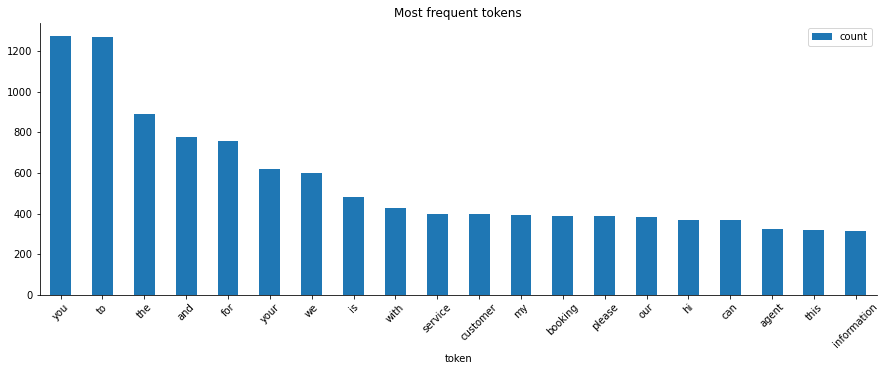

In [126]:
word_counts = X_train_transformed.toarray().sum(axis=0)

def plot_most_frequent(words, word_counts, top=20):
    words_df = pd.DataFrame({"token": words, 
                             "count": word_counts})
    
    fig, ax = plt.subplots(figsize=(0.75*top, 5))
    words_df.sort_values(by="count", ascending=False).head(top)\
        .set_index("token")\
        .plot(kind="bar", rot=45, ax=ax)
    sns.despine()
    plt.title("Most frequent tokens")
    plt.show()
    
plot_most_frequent(words, word_counts)

In [127]:
bagofwords = CountVectorizer(stop_words="english")
bagofwords.fit(X_train)

X_train_transformed = bagofwords.transform(X_train) 
X_test_transformed = bagofwords.transform(X_test) 

X_train_transformed.shape

(1667, 2968)

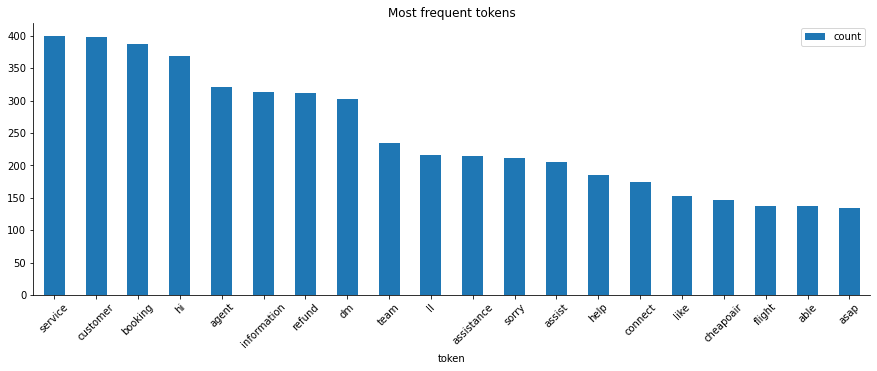

In [128]:
words = bagofwords.get_feature_names()
word_counts = X_train_transformed.toarray().sum(axis=0)

plot_most_frequent(words, word_counts)

In [129]:
# Fitting a model
logreg = LogisticRegression(C = 0.1)
logreg.fit(X_train_transformed, y_train)

# Training and test score
print(f"Train score: {logreg.score(X_train_transformed, y_train)}")
print(f"Test score: {logreg.score(X_test_transformed, y_test)}")

Train score: 0.862627474505099
Test score: 0.8309002433090025


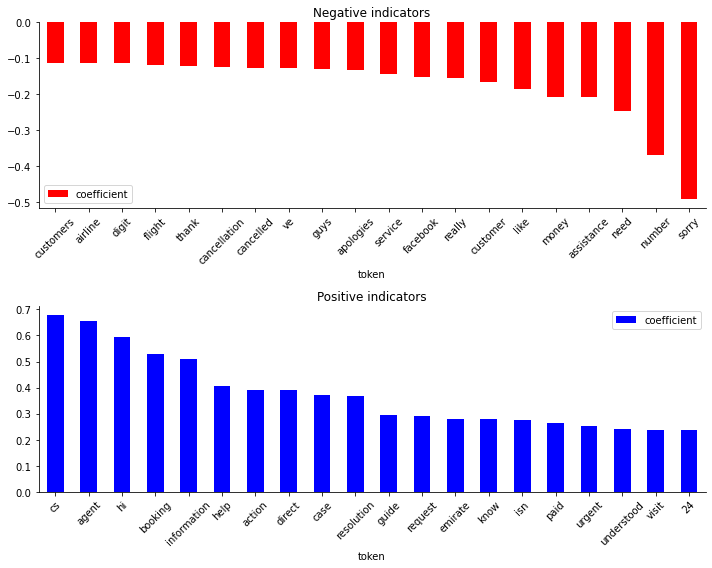

In [130]:
def plot_coefs(logreg, words):
    coef_df = pd.DataFrame({"coefficient": logreg.coef_[0], "token": words})
    coef_df = coef_df.sort_values("coefficient", ascending=False)

    fig, axs = plt.subplots(2, 1, figsize=(10, 8))

    # smallest coefficient -> tokens indicating negative sentiment 
    coef_df.tail(20).set_index("token").plot(kind="bar", rot=45, ax=axs[0], color="red")
    axs[0].set_title("Negative indicators")
 
    
    # largest coefficient -> tokens indicating positive sentiment 
    coef_df.head(20).set_index("token").plot(kind="bar", rot=45, ax=axs[1], color="blue")
    axs[1].set_title("Positive indicators")
    
    sns.despine()
    plt.tight_layout()
    plt.show()
    
plot_coefs(logreg, words)

In [131]:
bagofwords = CountVectorizer(stop_words="english", min_df=5)
bagofwords.fit(X_train)

X_train_transformed = bagofwords.transform(X_train)

X_train_transformed.shape

(1667, 683)

In [132]:
bagofwords = CountVectorizer(stop_words="english",
                             min_df=5,
                             max_features=1000)
bagofwords.fit(X_train)

X_train_transformed = bagofwords.transform(X_train)

X_train_transformed.shape

(1667, 683)

In [133]:
import nltk

# Let's test it out
stemmer = nltk.stem.PorterStemmer()

[stemmer.stem(i) for i in ['run', 'runs', 'running', 'ran', 'jogged', 'jogging', 'jogs']]

['run', 'run', 'run', 'ran', 'jog', 'jog', 'jog']

In [134]:
bagofwords = CountVectorizer(min_df=5, 
                             tokenizer = lambda x: [stemmer.stem(i) for i in x.split(' ')], 
                             stop_words='english')
bagofwords.fit(X_train)

X_train_transformed = bagofwords.transform(X_train)
X_test_transformed = bagofwords.transform(X_test)

/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_extraction/text.py:489: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'

/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_extraction/text.py:388: UserWarning:

Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['abov', 'afterward', 'alon', 'alreadi', 'alway', 'ani', 'anoth', 'anyon', 'anyth', 'anywher', 'becam', 'becaus', 'becom', 'befor', 'besid', 'cri', 'describ', 'dure', 'els', 'elsewher', 'empti', 'everi', 'everyon', 'everyth', 'everywher', 'fifti', 'formerli', 'forti', 'ha', 'henc', 'hereaft', 'herebi', 'hi', 'howev', 'hundr', 'inde', 'latterli', 'mani', 'meanwhil', 'moreov', 'mostli', 'nobodi', 'noon', 'noth', 'nowher', 'onc', 'onli', 'otherwis', 'ourselv', 'perhap', 'pleas', 'seriou', 'sever', 'sinc', 'sincer', 'sixti', 'someon', 'someth', 'sometim', 'somewher', 'themselv', 'thenc', 'thereaft', 'therebi', 'therefor

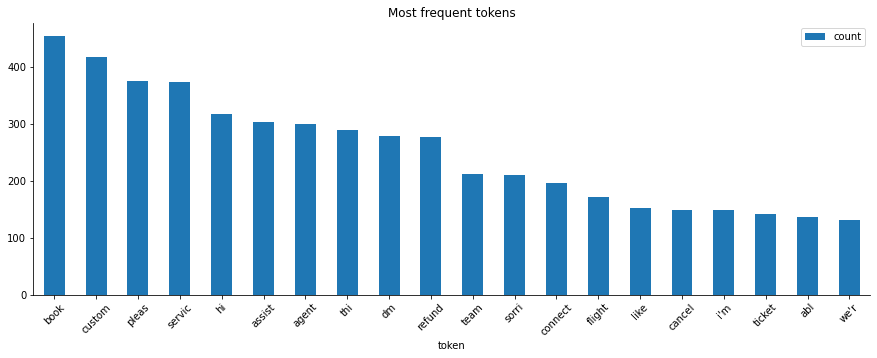

In [135]:
words = bagofwords.get_feature_names()
word_counts = X_train_transformed.toarray().sum(axis=0)

plot_most_frequent(words, word_counts)

In [136]:
# the python string package has a helpful punctuation list
import string
print(string.punctuation)

!"#$%&'()*+,-./:;<=>?@[\]^_`{|}~


In [137]:
# a dummy sentence used for checking our process
sentence = "The quick brown fox, jumped over the lazy dog!!"

# after splitting the text based on spaces
split_sentence = sentence.split(' ')

# we stem and remove punctuation
tokenized_sentence = []
for word in split_sentence:
    for punctuation_mark in string.punctuation:
        word = word.replace(punctuation_mark, '')
    stemmed_word = stemmer.stem(word)
    tokenized_sentence.append(stemmed_word)
    
print(tokenized_sentence)

['the', 'quick', 'brown', 'fox', 'jump', 'over', 'the', 'lazi', 'dog']


In [138]:
# import the nltk stopwords
nltk.download('stopwords')
from nltk.corpus import stopwords 

ENGLISH_STOP_WORDS = stopwords.words('english')

def my_tokenizer(sentence):
    # remove punctuation and set to lower case
    for punctuation_mark in string.punctuation:
        sentence = sentence.replace(punctuation_mark,'').lower()

    # split sentence into words
    listofwords = sentence.split(' ')
    listofstemmed_words = []
    
    # remove stopwords and any tokens that are just empty strings
    for word in listofwords:
        if (not word in ENGLISH_STOP_WORDS) and (word!=''):
            # Stem words
            stemmed_word = stemmer.stem(word)
            listofstemmed_words.append(stemmed_word)

    return listofstemmed_words

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/d_anderson/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [139]:
# checking tokenizer on simple sentence from above
my_tokenizer(sentence)

['quick', 'brown', 'fox', 'jump', 'lazi', 'dog']

In [140]:
bagofwords = CountVectorizer(min_df=5, 
                             tokenizer=my_tokenizer)
bagofwords.fit(X_train)

X_train_transformed = bagofwords.transform(X_train)
X_test_transformed = bagofwords.transform(X_test)

X_train_transformed.shape

(1667, 706)

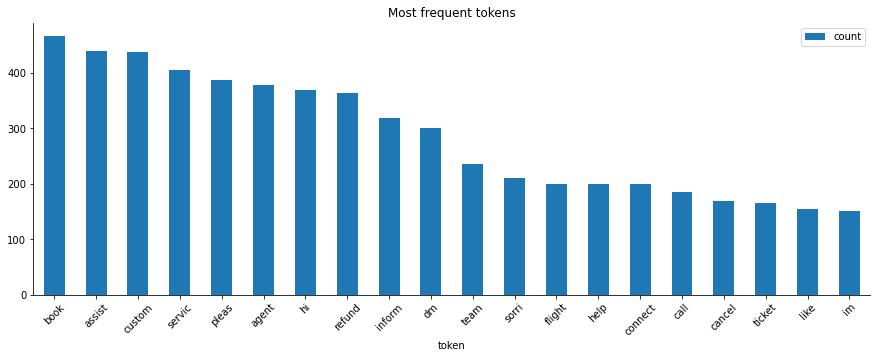

In [141]:
words = bagofwords.get_feature_names()
word_counts = X_train_transformed.toarray().sum(axis=0)

plot_most_frequent(words, word_counts)

In [142]:
# Fitting a model
logreg = LogisticRegression(C = 0.1)
logreg.fit(X_train_transformed, y_train)

# Training and test score
print(f"Train score: {logreg.score(X_train_transformed, y_train)}")
print(f"Test score: {logreg.score(X_test_transformed, y_test)}")

Train score: 0.847630473905219
Test score: 0.8236009732360098


In [143]:
bagofwords = CountVectorizer(min_df=5,
                             tokenizer=my_tokenizer,
                             ngram_range=(1, 3))
bagofwords.fit(X_train)

X_train_transformed = bagofwords.transform(X_train)
X_test_transformed = bagofwords.transform(X_test)

X_train_transformed.shape

/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_extraction/text.py:489: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



(1667, 1876)

In [144]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [145]:
# using our custom tokenizer in TfidfVectorizer
tfidf = TfidfVectorizer(min_df=5,
                        tokenizer=my_tokenizer)
tfidf.fit(X_train)

X_train_transformed = tfidf.transform(X_train)
X_test_transformed = tfidf.transform(X_test)

X_train_transformed.shape

(1667, 706)

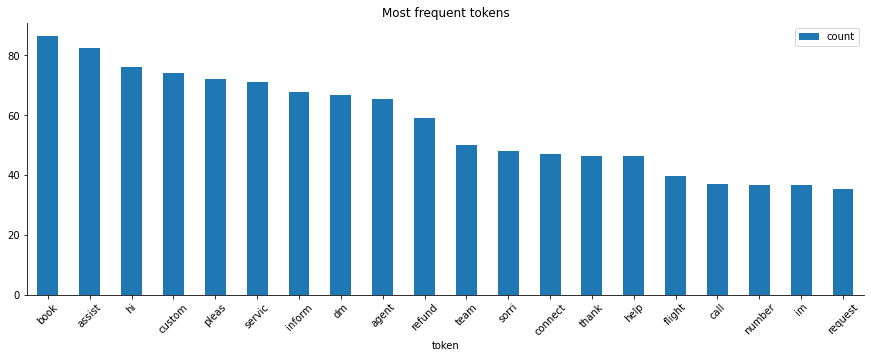

In [146]:
words = tfidf.get_feature_names()
word_weights = X_train_transformed.toarray().sum(axis=0)

plot_most_frequent(words, word_weights)

In [147]:
from sklearn.neighbors import NearestNeighbors

nn_model = NearestNeighbors(n_neighbors=1, metric="cosine")
nn_model.fit(X_train_transformed)

NearestNeighbors(metric='cosine', n_neighbors=1)

In [148]:
idx = 6
print(f"Selected test document:\n {X_test.iloc[idx]}")

# use the nearest neighbour model to find the closest document by the tf-idf representation
dist, neighbour_ind = nn_model.kneighbors(X_test_transformed[idx])

print(f"\nClosest training neighbour:\n {X_train.iloc[neighbour_ind[0]].values[0]}")

Selected test document:
 how the hell do you block for calling you out for holding his $6500 for almost 4 months? Give this man his money back. So unprofessional. Definitely gonna contact the BBB

Closest training neighbour:
 Highly unprofessional behavior


In [151]:
# sentiment polarity

from sklearn.feature_extraction.text import CountVectorizer
# store simplified data in X and y

y.value_counts()

 0    1962
 1     385
-1     117
 2      21
-2       3
 3       1
Name: use_total, dtype: int64

In [159]:
# create positive and negative review dfs

neg_reviews = np.where(df['use_total']==0)

neg = df.iloc[neg_reviews]
neg

,Category,Keyword,Web_Page_URL,Tweet_Website,Author_Name,Author_Web_Page_URL,Tweet_Timestamp,Tweet_Content,Tweet_Image_URL,Tweet_Video_URL,Tweet_Number_of_Likes,Tweet_Number_of_Retweets,Tweet_Number_of_Reviews,Tweet_Number_of_share,Comment_Website,Comment_Name,Comment_Author__URL,Comment_Timestamp,Comment_Content,Comment_Image_URL,Comment_Video_URL,Comment_Number_of_Likes,Comment_Number_of_Retweets,Comment_Number_of_Reviews,Comment_Number_of_share,clean_text,tfidf,card2vec,use,tsnetfidf,tsnec2v,tsneuse,tfidf_total,use_total
3,Post&Comment,NaN,https://twitter.com/CheapOair/with_replies,https://twitter.com/CheapOair/status/146858424...,@CheapOair,https://twitter.com/CheapOair,1638972744000,"Hi Nitin, we'll request assistance for you fro...",NaN,NaN,NaN,NaN,1.0,NaN,https://twitter.com/CheapOair/status/146861266...,@CheapOair,https://twitter.com/CheapOair,1638979520000,You should hear from an agent within the next ...,NaN,NaN,NaN,NaN,NaN,NaN,You should hear from an agent within the next ...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.1728947013616562, -0.18615615367889404, 0.0...","[0.02957305870950222, -0.07521861046552658, 0....","[8.163244247436523, -4.338978290557861]","[-8.785483360290527, -14.241729736328125]","[40.5698127746582, 12.82247543334961]",3,0
4,Post&Comment,NaN,https://twitter.com/CheapOair/with_replies,https://twitter.com/CheapOair/status/146858424...,@CheapOair,https://twitter.com/CheapOair,1638972744000,"Hi Nitin, we'll request assistance for you fro...",NaN,NaN,NaN,NaN,1.0,NaN,https://twitter.com/nitinra51423855/status/146...,@nitinra51423855,https://twitter.com/nitinra51423855,1638978372000,How long will take to resolve,NaN,NaN,NaN,NaN,1,NaN,How long will take to resolve,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.24307489395141602, -0.23939202725887299, -0...","[-0.013487453572452068, 0.018784064799547195, ...","[-5.720284461975098, 8.247477531433105]","[21.882829666137695, -0.39626920223236084]","[-16.937971115112305, -5.0731377601623535]",2,0
5,Post&Comment,NaN,https://twitter.com/CheapOair/with_replies,https://twitter.com/CheapOair/status/146858424...,@CheapOair,https://twitter.com/CheapOair,1638972744000,"Hi Nitin, we'll request assistance for you fro...",NaN,NaN,NaN,NaN,1.0,NaN,https://twitter.com/nitinra51423855/status/146...,@nitinra51423855,https://twitter.com/nitinra51423855,1638958134000,"Hi srilankan airline , on 3rd dc my flight was...",NaN,NaN,NaN,NaN,1,NaN,"Hi srilankan airline , on 3rd dc my flight was...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.19710588455200195, 0.1431170254945755, -0....","[0.009716123342514038, 0.040316883474588394, -...","[-13.233001708984375, -0.062114518135786057]","[45.79563522338867, 12.388443946838379]","[2.598869562149048, -57.624942779541016]",4,0
6,Post&Comment,NaN,https://twitter.com/CheapOair/with_replies,https://twitter.com/CheapOair/status/146858424...,@CheapOair,https://twitter.com/CheapOair,1638972744000,"Hi Nitin, we'll request assistance for you fro...",NaN,NaN,NaN,NaN,1.0,NaN,NaN,@CheapOair,https://twitter.com/CheapOair,NaN,"Hi Nitin, we'll request assistance for you fro...",NaN,NaN,NaN,NaN,NaN,NaN,"Hi Nitin, we'll request assistance for you fro...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.025182239711284637, -0.12873780727386475, 0...","[-0.021900061517953873, 0.08040313422679901, -...","[5.147465705871582, 42.70750045776367]","[13.84754467010498, 13.803601264953613]","[24.793371200561523, 17.025728225708008]",3,0
7,Post&Comment,NaN,https://twitter.com/CheapOair/with_replies,https://twitter.com/CheapOair/status/146858377...,@CheapOair,https://twitter.com/CheapOair,1638972631000,"Hi Pooja! Unfortunately, our team here on Twit...",NaN,NaN,NaN,NaN,1.0,NaN,https://twitter.com/CheapOair/status/146794733...,@CheapOair,https://twitter.com/CheapOair,1638820892000,‘Tis the season for twinkling lights! Have a ...,https://pbs.twimg.com/media/FF8yUpiXsActJ-Y?fo...,NaN,3,NaN,1,NaN,'Tis the season for twinkling l

In [154]:
neg['use_total'].value_counts()

0    2489
Name: use_total, dtype: int64

In [160]:
pos_reviews = np.where(df['use_total']==1)

pos = df.iloc[pos_reviews]
pos

,Category,Keyword,Web_Page_URL,Tweet_Website,Author_Name,Author_Web_Page_URL,Tweet_Timestamp,Tweet_Content,Tweet_Image_URL,Tweet_Video_URL,Tweet_Number_of_Likes,Tweet_Number_of_Retweets,Tweet_Number_of_Reviews,Tweet_Number_of_share,Comment_Website,Comment_Name,Comment_Author__URL,Comment_Timestamp,Comment_Content,Comment_Image_URL,Comment_Video_URL,Comment_Number_of_Likes,Comment_Number_of_Retweets,Comment_Number_of_Reviews,Comment_Number_of_share,clean_text,tfidf,card2vec,use,tsnetfidf,tsnec2v,tsneuse,tfidf_total,use_total
10,Post&Comment,NaN,https://twitter.com/CheapOair/with_replies,https://twitter.com/CheapOair/status/146858377...,@CheapOair,https://twitter.com/CheapOair,1638972631000,"Hi Pooja! Unfortunately, our team here on Twit...",NaN,NaN,NaN,NaN,1.0,NaN,https://twitter.com/PoojaKunwar16/status/14685...,@PoojaKunwar16,https://twitter.com/PoojaKunwar16,1638973341000,Thanks . I have messaged the booking confirmat...,NaN,NaN,NaN,NaN,NaN,NaN,Thanks . I have messaged the booking confirmat...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.33125123381614685, 0.059790533035993576, 0....","[-0.0272752083837986, 0.02940017357468605, 0.0...","[-2.2367684841156006, -10.184176445007324]","[34.8419303894043, -10.239431381225586]","[23.718503952026367, 29.413225173950195]",3,1
13,Post&Comment,NaN,https://twitter.com/CheapOair/with_replies,https://twitter.com/CheapOair/status/146830945...,@CheapOair,https://twitter.com/CheapOair,1638907227000,Looking for a holiday gift the whole family wi...,https://pbs.twimg.com/card_img/146830946441571...,NaN,3.0,NaN,2.0,NaN,https://twitter.com/CheapOair/status/146830945...,@CheapOair,https://twitter.com/CheapOair,NaN,Looking for a holiday gift the whole family wi...,NaN,NaN,NaN,NaN,NaN,NaN,Looking for a holiday gift the whole family wi...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.25512388348579407, -0.4029279947280884, 0.1...","[0.0056931329891085625, -0.07197204977273941, ...","[-18.392662048339844, 10.828526496887207]","[-43.231651306152344, 16.7100887298584]","[-48.52449417114258, -18.181941986083984]",2,1
18,Post&Comment,NaN,https://twitter.com/CheapOair/with_replies,https://twitter.com/CheapOair/status/146822530...,@CheapOair,https://twitter.com/CheapOair,1638887166000,"Hi there, we're really sorry about that! Pleas...",NaN,NaN,NaN,NaN,1.0,NaN,https://twitter.com/macktitler/status/14684341...,@macktitler,https://twitter.com/macktitler,1638936960000,DM sent,NaN,NaN,NaN,NaN,NaN,NaN,DM sent,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.061337660998106, 0.1869056522846222, 0.051...","[0.09892240911722183, 0.017215995118021965, -0...","[4.5559611320495605, -19.31378746032715]","[34.297054290771484, -17.148927688598633]","[-26.919893264770508, 30.10658073425293]",1,1
31,Post&Comment,NaN,https://twitter.com/CheapOair/with_replies,https://twitter.com/CheapOair/status/146646020...,@CheapOair,https://twitter.com/CheapOair,1638466332000,"Hi there, this is not the experience we want y...",NaN,NaN,NaN,NaN,1.0,NaN,https://twitter.com/CheapOair/status/146651551...,@CheapOair,https://twitter.com/CheapOair,1638479519000,We'll need your name & email as well. Please D...,NaN,NaN,NaN,NaN,NaN,NaN,We'll need your name & email as well. Please D...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.1463693231344223, -0.10824085772037506, -0....","[0.03171369433403015, -0.008698252961039543, 0...","[21.719005584716797, -44.75319290161133]","[39.71672821044922, -30.776004791259766]","[-15.21856689453125, 45.04732131958008]",3,1
68,Post&Comment,NaN,https://twitter.com/CheapOair/with_replies,https://twitter.com/CheapOair/status/146615526...,@CheapOair,https://twitter.com/CheapOair,1638393630000,"Hi Ella, we're so sorry for the inconvenience ...",NaN,NaN,1.0,NaN,1.0,NaN,https://twitter.com/Ellajane2408/status/146679...,@Ellajane2408,https://twitter.com/Ellajane2408,1638546465000,I’ve been ghosted,NaN,NaN,NaN,NaN,1,NaN,I've been ghosted,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

In [162]:
neg_reviews = neg
pos_reviews = pos

In [163]:
# Convert to array
neg_reviews = neg_reviews[['clean_text']].to_numpy()

In [164]:
# Convert to array
pos_reviews = pos_reviews[['clean_text']].to_numpy()

In [165]:
neg_reviews = neg_reviews.flatten()
pos_reviews = pos_reviews.flatten()


In [166]:
from sklearn.feature_extraction import text


In [167]:
stop_words = text.ENGLISH_STOP_WORDS


In [168]:
%%time
from sklearn.feature_extraction.text import TfidfVectorizer

# Create a vectorizer object to generate term document counts
tfidf_pos = TfidfVectorizer(stop_words=stop_words, min_df=10, max_df=0.5, 
                        ngram_range=(1,1), token_pattern='[a-z][a-z]+')

tfidf_neg = TfidfVectorizer(stop_words=stop_words, min_df=10, max_df=0.5, 
                        ngram_range=(1,1), token_pattern='[a-z][a-z]+')

# Get random subset of reviews
np.random.seed(38)
num_reviews = 2000
random_neg = np.random.choice(neg_reviews, size=num_reviews)
random_pos = np.random.choice(pos_reviews, size=num_reviews)

dicty = {'flights':'flight', 'prices':'price', 'travels':'travel',
         'layovers':'layover', 'services':'service'}
def replace_words(text, dicty):
    '''Returns text with word substitutions made according
       to the passed `dicty` dictionary'''
    for i,j in dicty.items():
        text = text.replace(i,j)
    return text

random_neg = [replace_words(w, dicty) for w in random_neg]
random_pos = [replace_words(w, dicty) for w in random_pos]

# Get the vectors
neg_vectors = tfidf_neg.fit_transform(random_neg)
pos_vectors = tfidf_pos.fit_transform(random_pos)

CPU times: user 70.3 ms, sys: 2.64 ms, total: 72.9 ms
Wall time: 74.3 ms


In [169]:
# Store TFIDF vectors in a df for later use
neg_df = pd.DataFrame(neg_vectors.todense(), columns=[tfidf_neg.get_feature_names()])
pos_df = pd.DataFrame(pos_vectors.todense(), columns=[tfidf_pos.get_feature_names()])

# get mean for each word
# high mean = important
col_means_neg = {}
for col in neg_df:
    col_means_neg[col] = neg_df[col].mean()

col_means_pos = {}
for col in pos_df:
    col_means_pos[col] = pos_df[col].mean()

In [170]:
no_top_words = 8

print('Top %d words in POSITIVE reviews:' %no_top_words, end='')
print(sorted(col_means_pos, key=col_means_pos.get, reverse=True)[:no_top_words])

print('Top %d words in NEGATIVE reviews:' %no_top_words, end='')
print(sorted(col_means_neg, key=col_means_neg.get, reverse=True)[:no_top_words])

Top 8 words in POSITIVE reviews:[('refund',), ('need',), ('thank',), ('service',), ('number',), ('customer',), ('dm',), ('money',)]
Top 8 words in NEGATIVE reviews:[('booking',), ('hi',), ('dm',), ('customer',), ('information',), ('service',), ('agent',), ('sorry',)]


In [171]:
pip install gensim

Note: you may need to restart the kernel to use updated packages.


In [172]:
# LSA
from gensim import corpora, models, similarities, matutils

# Convert to gensim corpus
# Transpose
tfidf_pos_corp = matutils.Sparse2Corpus(pos_vectors.transpose())
tfidf_neg_corp = matutils.Sparse2Corpus(neg_vectors.transpose())

# Row indices
id2word_pos = dict((v,k) for k,v in tfidf_pos.vocabulary_.items())
id2word_neg = dict((v,k) for k,v in tfidf_neg.vocabulary_.items())

id2word_pos = corpora.Dictionary.from_corpus(tfidf_pos_corp, id2word=id2word_pos)
id2word_neg = corpora.Dictionary.from_corpus(tfidf_neg_corp, id2word=id2word_neg)

In [173]:
# create LSA model
# LSA model
num_topics = 10
lsi_pos = models.LsiModel(tfidf_pos_corp, id2word=id2word_pos, num_topics=num_topics)
lsi_neg = models.LsiModel(tfidf_neg_corp, id2word=id2word_neg, num_topics=num_topics)

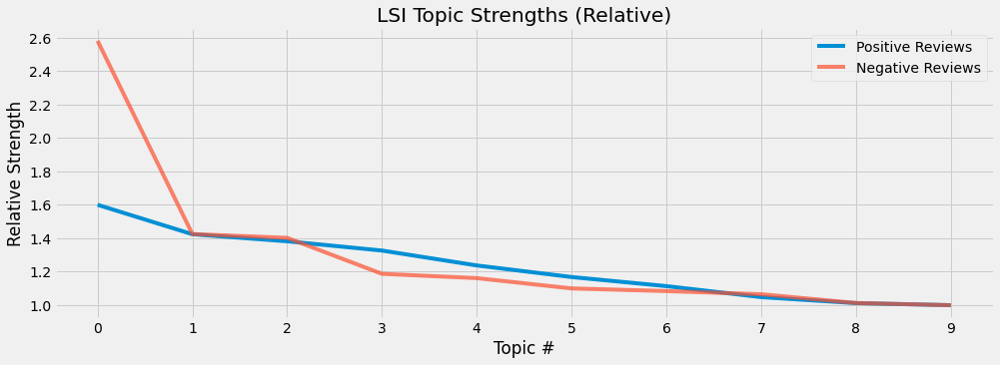

In [174]:
# elbow plot
singular_values_pos = lsi_pos.projection.s.tolist()
singular_values_pos_rel = [sv/singular_values_pos[-1] for sv in singular_values_pos]
singular_values_neg = lsi_neg.projection.s.tolist()
singular_values_neg_rel = [sv/singular_values_neg[-1] for sv in singular_values_neg]

plt.style.use('fivethirtyeight')
plt.figure(figsize=(15,5))
plt.plot(range(len(singular_values_pos)), singular_values_pos_rel, label='Positive Reviews', alpha=1.0)
plt.plot(range(len(singular_values_neg)), singular_values_neg_rel, label='Negative Reviews', alpha=0.7)
plt.xticks(range(len(singular_values_pos)), range(len(singular_values_pos)))
plt.xlabel('Topic #')
plt.ylabel('Relative Strength')
plt.title('LSI Topic Strengths (Relative)')
plt.legend(loc=0, fontsize='medium');

In [175]:
topics = 2

In [176]:
# check out top 5 positive topics
print('Top %d topics for POSITIVE reviews' %(topics))
print('-'*33)
print(lsi_pos.show_topics()[0:topics])

Top 2 topics for POSITIVE reviews
---------------------------------
[(0, '-0.399*"refund" + -0.321*"need" + -0.225*"money" + -0.196*"dm" + -0.192*"number" + -0.176*"don" + -0.165*"booking" + -0.149*"thanks" + -0.148*"company" + -0.143*"cancellation"'), (1, '-0.305*"dm" + 0.296*"refund" + -0.275*"thanks" + -0.230*"information" + -0.219*"privacy" + -0.219*"purposes" + -0.214*"number" + -0.199*"ll" + -0.195*"email" + -0.182*"need"')]


In [177]:
# check out top 5 negative topics
print('Top %d topics for NEGATIVE reviews' %(topics))
print('-'*33)
print(lsi_neg.show_topics()[0:topics])

Top 2 topics for NEGATIVE reviews
---------------------------------
[(0, '-0.303*"hi" + -0.289*"dm" + -0.281*"booking" + -0.273*"information" + -0.253*"customer" + -0.250*"service" + -0.230*"sorry" + -0.219*"agent" + -0.210*"assistance" + -0.189*"connect"'), (1, '0.364*"refund" + -0.271*"dm" + -0.246*"information" + 0.210*"customer" + 0.199*"service" + 0.197*"flight" + -0.187*"booking" + 0.167*"ticket" + 0.165*"know" + 0.162*"let"')]


In [178]:
%%time
# negative values in LSA topics are not working
# could have better luck with NMF
from sklearn.decomposition import NMF

# change num_topics
num_topics = 3

nmf_pos = NMF(n_components=num_topics)
W_pos = nmf_pos.fit_transform(pos_vectors)
H_pos = nmf_pos.components_

nmf_neg = NMF(n_components=num_topics)
W_neg = nmf_neg.fit_transform(neg_vectors)
H_neg = nmf_neg.components_

CPU times: user 495 ms, sys: 10.1 ms, total: 505 ms
Wall time: 98.8 ms


/opt/anaconda3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:312: FutureWarning:

The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).

/opt/anaconda3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:312: FutureWarning:

The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).



In [179]:
def display_topics(model, feature_names, num_topics, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        if topic_idx < num_topics:
            print("{:11}".format("Topic %d:" %(topic_idx)), end='')
            print(", ".join(['{:04.3f}*'.format(topic[i])+feature_names[i] \
                             for i in topic.argsort()[:-no_top_words-1:-1]]))

no_topics = num_topics
no_top_words = 6

print('Top topics + words for POSITIVE reviews')
print('-'*39)
display_topics(nmf_pos, tfidf_pos.get_feature_names(), no_topics, no_top_words)

print('\nTop topics + words for NEGATIVE reviews')
print('-'*39)
display_topics(nmf_neg, tfidf_neg.get_feature_names(), no_topics, no_top_words)

Top topics + words for POSITIVE reviews
---------------------------------------
Topic 0:   1.618*refund, 0.937*money, 0.700*don, 0.637*company, 0.632*promised, 0.627*cancellation
Topic 1:   0.918*dm, 0.871*need, 0.777*thanks, 0.734*number, 0.653*information, 0.618*purposes
Topic 2:   1.001*lo, 0.815*para, 0.728*sentimos, 0.697*mucho, 0.679*solicitaremos, 0.584*una

Top topics + words for NEGATIVE reviews
---------------------------------------
Topic 0:   1.419*dm, 1.324*booking, 1.301*information, 1.062*hi, 0.860*help, 0.846*sorry
Topic 1:   1.343*customer, 1.311*service, 0.882*agent, 0.702*team, 0.653*twitter, 0.620*assist
Topic 2:   1.420*refund, 0.772*flight, 0.657*ticket, 0.644*cheapoair, 0.576*cancelled, 0.495*request


In [180]:
# look at a random positive review
review_num = np.random.randint(0, high=len(random_pos))
print(review_num)
print(random_pos[review_num])

769
Hi Kartik, we'll need your 8 digit CheapOair booking number to proceed.


In [181]:
# compute cosine similarities of this review wiht the rest
import sklearn.metrics.pairwise as smp

cosines = {}
for ind, review in enumerate(W_pos):
    similarity = smp.cosine_similarity(W_pos[review_num].reshape(1,-1), review.reshape(1,-1))
    cosines[ind] = similarity[0][0]

In [182]:
# get top 3 matching reviews
for n in sorted(cosines, key=cosines.get, reverse=True)[1:4]:
    print('-'*50)
    print('>> Similarity {:.3f}'.format(cosines[n]))
    print(random_pos[n])
print('-'*50)

--------------------------------------------------
>> Similarity 1.000
Hi Kartik, we'll need your 8 digit CheapOair booking number to proceed.
--------------------------------------------------
>> Similarity 1.000
Hi Kartik, we'll need your 8 digit CheapOair booking number to proceed.
--------------------------------------------------
>> Similarity 1.000
Hi Kartik, we'll need your 8 digit CheapOair booking number to proceed.
--------------------------------------------------


In [183]:

# Create a vectorizer object to generate term document counts
cv_pos = CountVectorizer(stop_words=stop_words, min_df=10, max_df=0.5, 
                        ngram_range=(1,1), token_pattern='[a-z][a-z]+')

cv_neg = CountVectorizer(stop_words=stop_words, min_df=10, max_df=0.5, 
                        ngram_range=(1,1), token_pattern='[a-z][a-z]+')

# Get random subset of reviews
np.random.seed(38)
num_reviews = 15000
cv_random_neg = np.random.choice(neg_reviews, size=num_reviews)
cv_random_pos = np.random.choice(pos_reviews, size=num_reviews)

# replace words from defined dictionary 'dicty'
cv_random_neg = [replace_words(w, dicty) for w in cv_random_neg]
cv_random_pos = [replace_words(w, dicty) for w in cv_random_pos]

# Get the cv vectors
cv_neg_vectors = cv_neg.fit_transform(cv_random_neg).transpose()
cv_pos_vectors = cv_pos.fit_transform(cv_random_pos).transpose()